In [1]:
# ----install SAM, Stable Diffusion and libraries
!pip -q install diffusers transformers scipy segment_anything
# ------install GroundingDINO, DINO weights
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO
!pip -q install -e .
%mkdir weights
%cd weights
!wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.6 MB/s eta 0:00:00
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 415, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 415 (delta 136), reused 123 (delta 120), pack-reused 238
Receiving objects: 100% (415/415), 12.85 MiB | 2.84 MiB/s, done.
Resolving deltas: 100% (214/214), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 13.3 MB/s eta 0:00:00
/content/GroundingDINO/weights


In [1]:
# ----SAM
from segment_anything import SamPredictor, sam_model_registry
# ----Stable Diffusion
from diffusers import StableDiffusionInpaintPipeline
# ----GroundingDINO
from groundingdino.util.inference import load_model, load_image, predict, annotate
from GroundingDINO.groundingdino.util import box_ops
# ----Extra Libraries
from PIL import Image
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from google.colab import files

# Upload the image file
uploaded = files.upload()

Saving fire3.jpeg to fire3.jpeg


In [3]:
img_path = '/content/fire3.jpeg'
src, img = load_image(img_path)

In [4]:
# -----Set Image and CUDA
device = "cuda"

# ------SAM Parameters
model_type = "vit_h"
predictor = SamPredictor(sam_model_registry[model_type](checkpoint="/content/GroundingDINO/weights/sam_vit_h_4b8939.pth").to(device=device))
# ------Stable Diffusion
pipe = StableDiffusionInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-2-inpainting", torch_dtype=torch.float16,).to(device)
# ----Grounding DINO


model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

Cannot initialize model with low cpu memory usage because `accelerate` was not found in the environment. Defaulting to `low_cpu_mem_usage=False`. It is strongly recommended to install `accelerate` for faster and less memory-intense model loading. You can do so with: 
```
pip install accelerate
```
.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [5]:
groundingdino_model = load_model("/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py", "/content/GroundingDINO/weights/groundingdino_swint_ogc.pth")
# ---- prompt is for identifying target object in the image
TEXT_PROMPT = "fire hydrant"
BOX_TRESHOLD = 0.3
TEXT_TRESHOLD = 0.25

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [6]:
def show_mask(mask, image, random_color=True):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image.cpu().numpy() * 255).astype(np.uint8)).convert("RGBA")

    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

In [7]:
boxes, logits, phrases = predict(
    model=groundingdino_model,
    image=img,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)
img_annnotated = annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


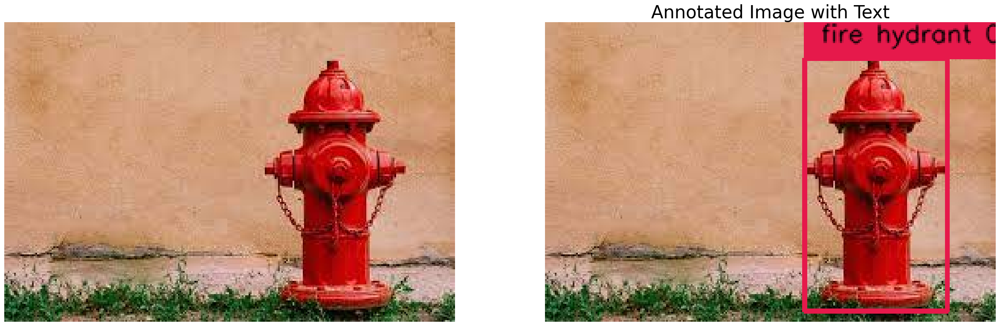

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Annotated Image with Text", fontsize=30)
axes[0].imshow(src)
axes[0].axis('off')
axes[1].imshow(img_annnotated)
axes[1].axis('off')

plt.show()

In [9]:
predictor.set_image(src)
H, W, _ = src.shape
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
new_boxes = predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

In [10]:
masks, _, _ = predictor.predict_torch(
            point_coords = None,
            point_labels = None,
            boxes = new_boxes,
            multimask_output = False,
        )

In [11]:
img_annotated_mask = Image.fromarray(show_mask(masks[0][0].cpu(), img_annnotated))
original_img = Image.fromarray(src).resize((512, 512))
img_annotated = Image.fromarray(img_annnotated)
only_mask = Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))

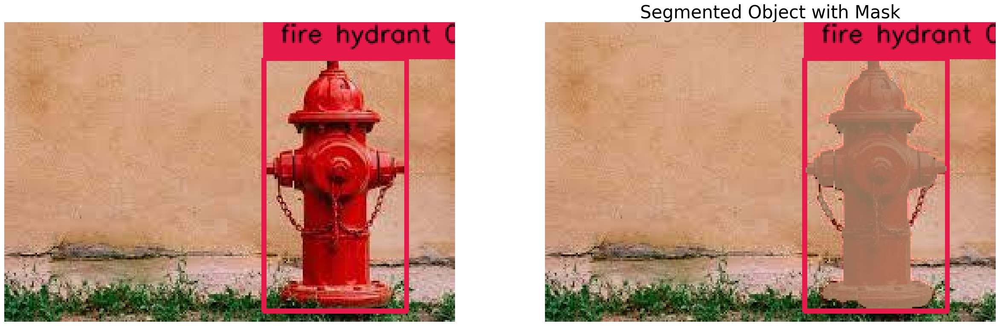

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Segmented Object with Mask", fontsize=30)
axes[0].imshow(img_annnotated)
axes[0].axis('off')
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
plt.show()

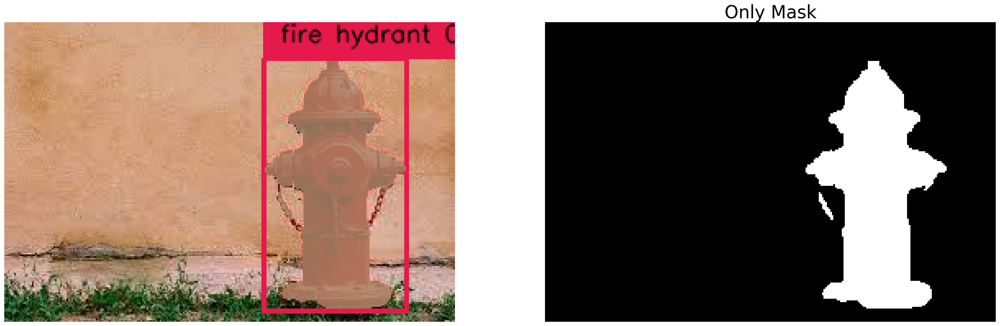

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))
plt.title("Only Mask", fontsize=30)
axes[0].imshow(img_annotated_mask)
axes[0].axis('off')
axes[1].imshow(Image.fromarray(masks[0][0].cpu().numpy()))
axes[1].axis('off')

plt.show()

In [14]:
prompt = "Phone Booth" #replace with this object
edited = pipe(prompt=prompt, image=original_img, mask_image=only_mask).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

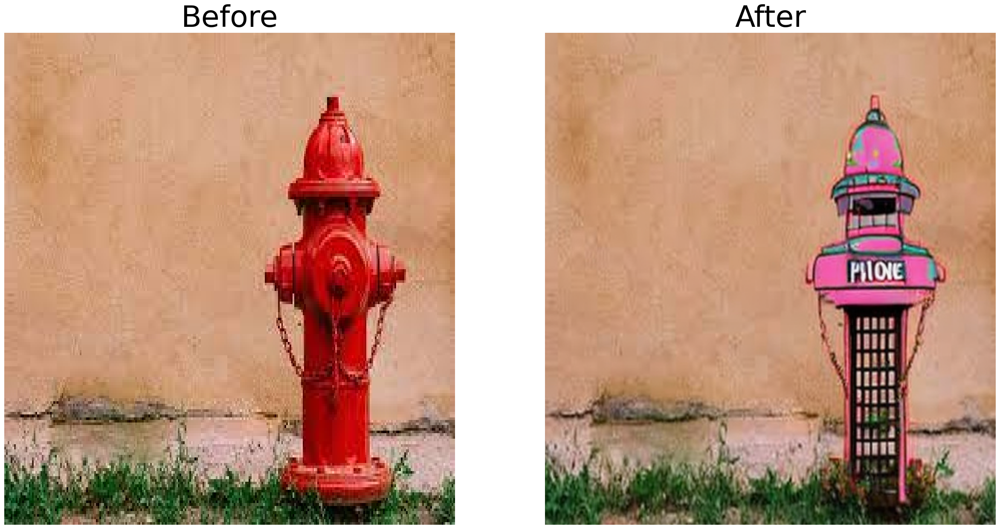

In [15]:
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(src)
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')
axes[1].imshow(edited)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()

In [16]:
def process_boxes(boxes, src):
    H, W, _ = src.shape
    boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])
    return predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)

def edit_image(path, item, prompt, box_threshold, text_threshold):
    '''
    - path (str): Path to the image file
    - item (str): Item to be recognized in the image
    - prompt (str): Item to replace the selected object in the image
    - box_threshold (float): Threshold for the bounding box predictions.
    - text_threshold (float): Threshold for the text predictions.
    '''
    src, img = load_image(path)
    boxes, logits, phrases = predict(
        model=groundingdino_model,
        image=img,
        caption=item,
        box_threshold=box_threshold,
        text_threshold=text_threshold
    )
    predictor.set_image(src)
    new_boxes = process_boxes(boxes, src)
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=new_boxes,
        multimask_output=False,
    )
    img_annotated_mask = show_mask(masks[0][0].cpu(),
        annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[...,::-1]
    )
    return pipe(prompt=prompt,
        image=Image.fromarray(src).resize((512, 512)),
        mask_image=Image.fromarray(masks[0][0].cpu().numpy()).resize((512, 512))
    ).images[0]

In [27]:
from google.colab import files

# Upload the image file
uploaded = files.upload()

Saving S1.jpg to S1.jpg


  0%|          | 0/50 [00:00<?, ?it/s]

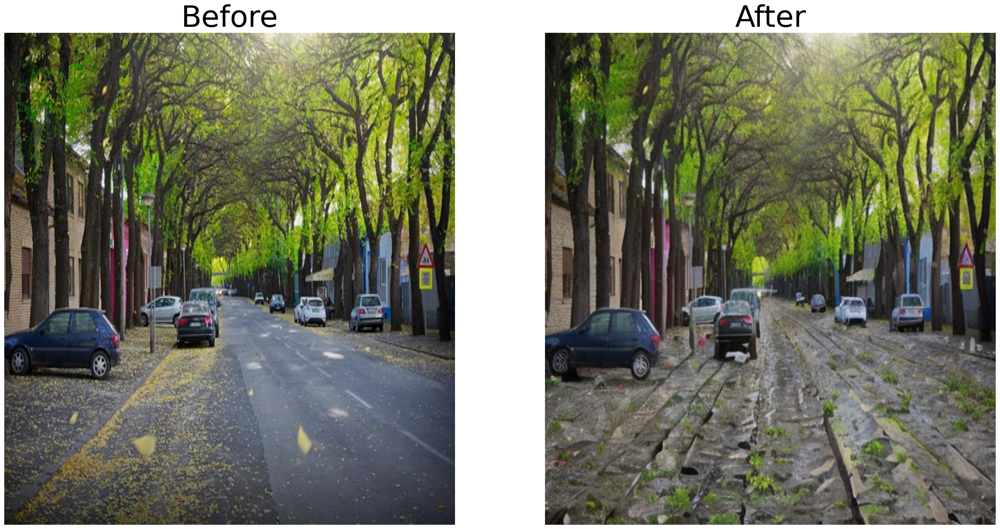

In [31]:
path = '/content/S1.jpg'
edited_image = edit_image(path, "road", "mud", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

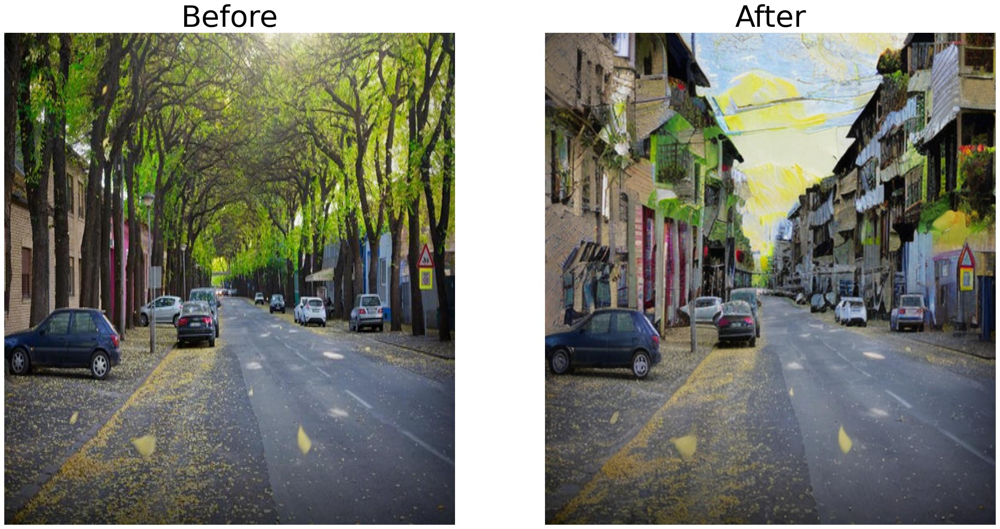

In [32]:
path = '/content/S1.jpg'
edited_image = edit_image(path, "trees", "houses", 0.5, 0.2)
fig, axes = plt.subplots(1, 2, figsize=(30, 15))

axes[0].imshow(plt.imread(path))
axes[0].axis('off')
axes[0].set_title('Before', fontdict={'fontsize': 50})
axes[0].set_aspect('auto')

axes[1].imshow(edited_image)
axes[1].axis('off')
axes[1].set_title('After', fontdict={'fontsize': 50})
axes[1].set_aspect('auto')
plt.show()